In [1]:
%matplotlib notebook
import numpy as np
import pickle
from matplotlib import pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import scipy as sp
from scipy.optimize import minimize

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
outdict = pickle.load(open("/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/Zernike_coefs_map-nominal-20180710.pickle",'rb'),encoding='iso-8859-1')

In [3]:
print(outdict[1])

[0.08250959709633061, -0.9353332318284949, 16.9203, -191.826, [0.16335417, 0.04209118, -0.47722926, 0.01731888, -0.02072751, -0.11661182, -0.07499869, 0.00662177, 0.26644876, -0.07200162, -0.0686725, 0.04443583, 0.00789245, 0.03902099, 0.01432855, -0.00331504, 0.0375199, -0.01361314, 0.0503574, 0.00222714, -0.00473283, -0.00852732, -0.00527068, -0.02972607, 0.00167757, 0.0045495, -0.00015644, -0.00026905, -0.00856108, 0.00075652, 0.00293147, -0.00078142, -0.00017493, 8.541e-05, 6.06e-06, -3.87e-06, 0.0013547]]


In [4]:
sensor_data = np.loadtxt("/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/posDECAM.txt",dtype={'names':('x','y','name'),'formats':('f','f','S3')})
print(sensor_data['name'])

[b'Cen' b'S1' b'S2' b'S3' b'S4' b'S5' b'S6' b'S7' b'S8' b'S9' b'S10'
 b'S11' b'S12' b'S13' b'S14' b'S15' b'S16' b'S17' b'S18' b'S19' b'S20'
 b'S21' b'S22' b'S23' b'S24' b'S25' b'S26' b'S27' b'S28' b'S29' b'S30'
 b'S31' b'N1' b'N2' b'N3' b'N4' b'N5' b'N6' b'N7' b'N8' b'N9' b'N10'
 b'N11' b'N12' b'N13' b'N14' b'N15' b'N16' b'N17' b'N18' b'N19' b'N20'
 b'N21' b'N22' b'N23' b'N24' b'N25' b'N26' b'N27' b'N28' b'N29' b'N30'
 b'N31' b'FS1' b'FS2' b'FS3' b'FS4' b'FN1' b'FN2' b'FN3' b'FN4']


In [5]:
n = len(outdict)
x_fp = np.zeros((n))
y_fp = np.zeros((n))
x_theta = np.zeros((n))
y_theta = np.zeros((n))
zern_fp = np.zeros((n,37))
for i in range(n):
 
    x_theta[i],y_theta[i],x_fp[i],y_fp[i],zern_coeff = outdict[i]
    for iz in range(37):
        zern_fp[i,:] = zern_coeff

In [6]:
print(n,x_fp)

71 [   0.       16.9203   16.9179   16.9114   16.9088   16.9114   16.9179
   16.9203   50.7631   50.7473   50.7331   50.7331   50.7473   50.7631
   84.6064   84.5905   84.57     84.57     84.5905   84.6064  118.451
  118.434   118.421   118.434   118.451   152.298   152.292   152.292
  152.298   186.134   186.144   186.134   -16.9203  -16.9179  -16.9114
  -16.9088  -16.9114  -16.9179  -16.9203  -50.7631  -50.7473  -50.7331
  -50.7331  -50.7473  -50.7631  -84.6064  -84.5905  -84.57    -84.57
  -84.5905  -84.6064 -118.451  -118.434  -118.421  -118.434  -118.451
 -152.298  -152.292  -152.292  -152.298  -186.134  -186.144  -186.134
  152.267   186.086   219.913   219.913  -152.267  -186.086  -219.913
 -219.913 ]


In [7]:
# match names to the Zernike array
m = len(sensor_data['x'])
sensor_fp = []
for i in range(n):
    for j in range(m):
        if np.abs(x_fp[i]-sensor_data['x'][j])<0.5 and np.abs(y_fp[i]-sensor_data['y'][j])<0.5 :
            sensor_fp.append(sensor_data['name'][j].decode())
            
print(len(sensor_fp),sensor_fp,type(sensor_fp[0]))

71 ['Cen', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28', 'S29', 'S30', 'S31', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'N8', 'N9', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29', 'N30', 'N31', 'FS1', 'FS2', 'FS3', 'FS4', 'FN1', 'FN2', 'FN3', 'FN4'] <class 'str'>


<IPython.core.display.Javascript object>


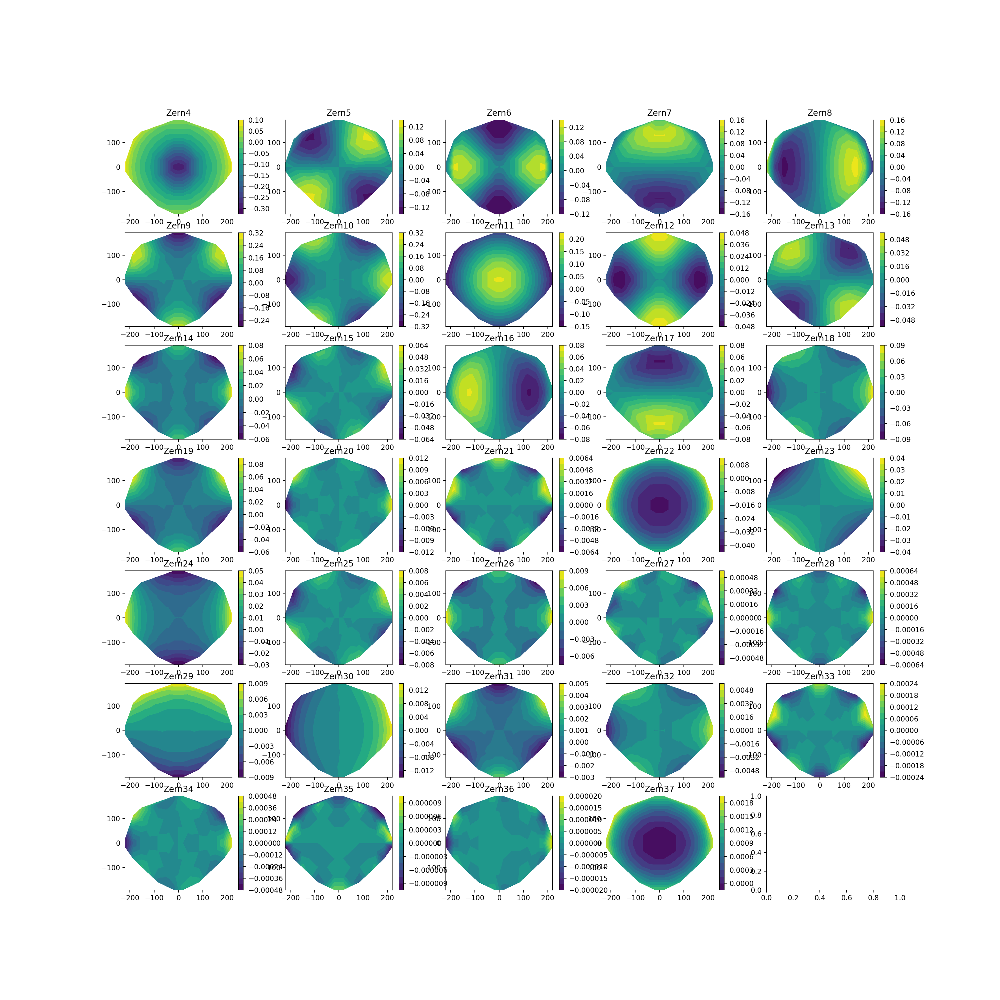

In [8]:
f,ax = plt.subplots(7,5,figsize=(20,20))
axf = ax.flatten()
aplots = []

for iz in range(3,37):
    aplot = axf[iz-3].tricontourf(x_fp, y_fp, zern_fp[:,iz], 15)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

In [9]:
def postotheta(xpos,ypos,degpermm=0.0048891,a7=-0.0021,a9=-0.0021):
    
# convert xpos,ypos to xtheta,ytheta
#
# F/# = 2.922 and Focal Length = 11719.07mm
# so Plate Scale = 206265/flength = 17.601 arcsec/mm
#
# 17.601 arcsec/mm / 3600 arcsec/deg = 0.0048891 deg/mm
#
# a7 and a9 are in units of deg/(deg^3)
#    degpermm = 0.0048891
#    a7 = -0.0021
#    a9 = -0.0021

    xpt = xpos*degpermm
    ypt = ypos*degpermm

    xtheta = xpt + a7 * xpt*xpt*xpt + a9 * xpt*ypt*ypt
    ytheta = ypt + a7 * ypt*ypt*ypt + a9 * ypt*xpt*xpt

    return xtheta,ytheta

In [10]:
degpermm = 0.0048891
xp = x_fp.flatten()
yp = y_fp.flatten()

xt = x_theta.flatten()
yt = y_theta.flatten()

def fitpostotheta(alpha):
    degpermm = alpha[0]
    a7 = alpha[1]
    a9 = alpha[2]
    
    xtheta,ytheta = postotheta(xp,yp,degpermm,a7,a9)
    
    xd = (xtheta-xt)/1e-4
    yd = (ytheta-yt)/1e-4
    
    diff = xd*xd + yd*yd
    chi2 = np.sum(diff)
    return chi2

# fit xt to function xp+a7*xp^3+a9*xp*yp^2

x0 = np.array([0.0048891,-0.0021,-0.0021])
res = minimize(fitpostotheta, x0, method='BFGS', options={'disp': True})
print(res)

         Current function value: 94.337045
         Iterations: 7
         Function evaluations: 377
         Gradient evaluations: 73
      fun: 94.33704490989338
 hess_inv: array([[ 2.62298767e-14, -5.95506672e-12, -6.92809015e-12],
       [-5.95506672e-12,  1.67616211e-09,  1.24919929e-09],
       [-6.92809015e-12,  1.24919929e-09,  3.91746752e-09]])
      jac: array([326.29446125,  -2.041008  ,  -0.55442524])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 377
      nit: 7
     njev: 73
   status: 2
  success: False
        x: array([ 0.00488579, -0.00214057, -0.00215884])


<IPython.core.display.Javascript object>


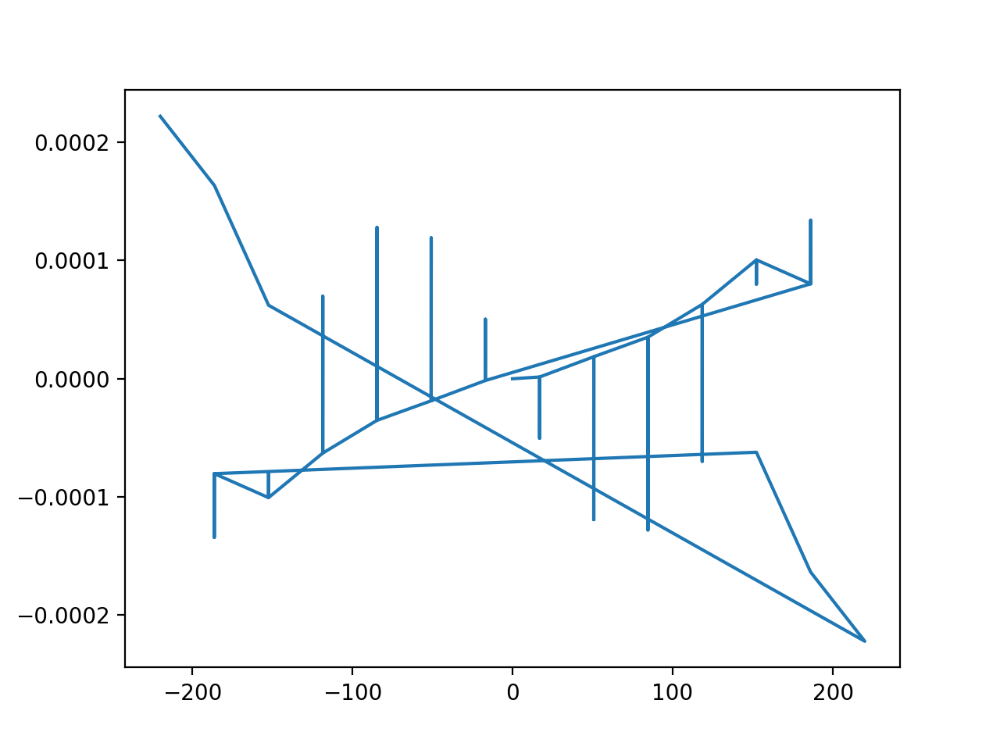

In [11]:
f = plt.figure()
xt_calc,yt_calc = postotheta(xp,yp,res.x[0],res.x[1],res.x[2])
plt.plot(xp,xt_calc-xt)

In [12]:
from donutlib.donututil import getZemaxWfm
from glob import glob

# convert Windows files with this command:
#iconv  -f UTF-16LE -t US-ASCII//IGNORE  wavefrontmap_Cen.txt  > temp.txt


from glob import glob
import os
files = glob("wavefrontmap*")
for afile in files:
    name = afile[:-4]
    command = "iconv  -f UTF-16LE -t US-ASCII//IGNORE  %s > %s-fixed.txt" % (afile,name)
    os.system(command)
    

<IPython.core.display.Javascript object>


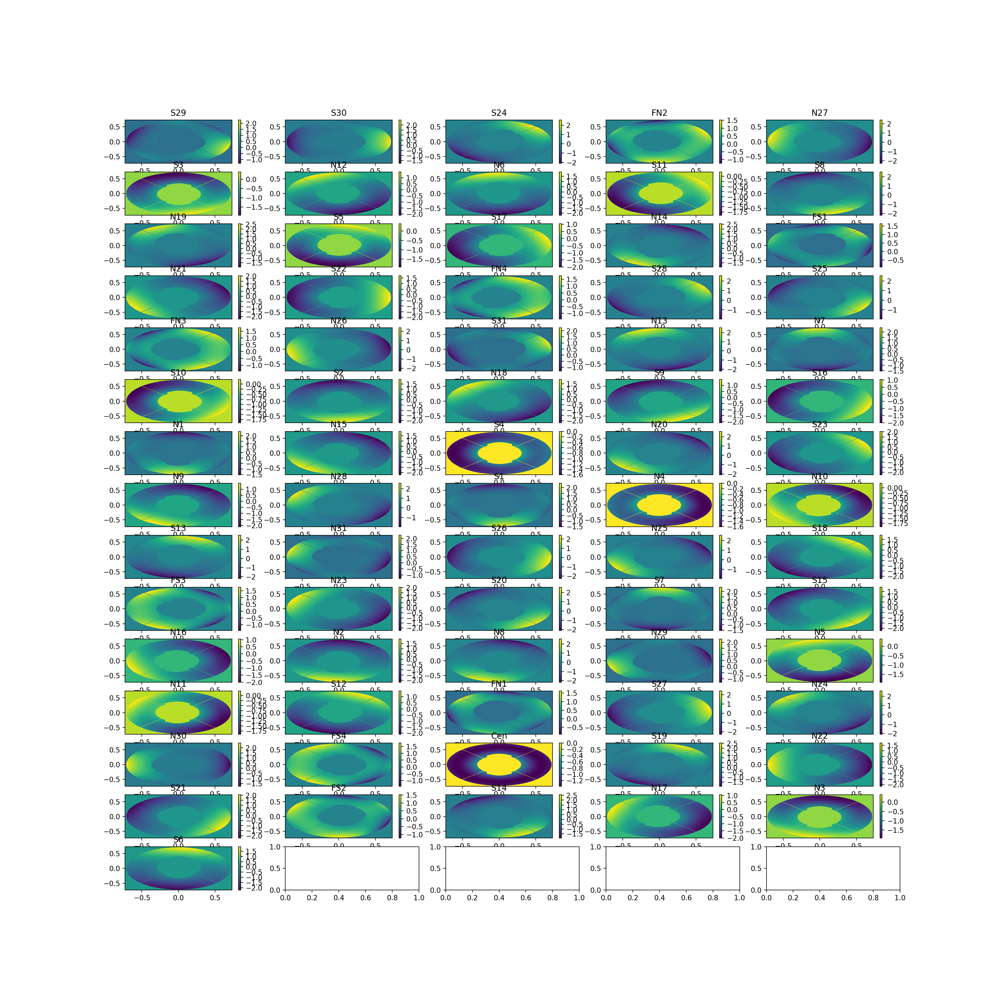

In [15]:

f,ax = plt.subplots(15,5,figsize=(20,20))
axf = ax.flatten()

files = glob("/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/wavefrontmap*-fixed.txt")
for i in range(len(files)):

    afile = files[i]
    x,y,d = getZemaxWfm(afile)

    aplot = axf[i].pcolormesh(x,y,d,cmap='viridis')
    f.colorbar(aplot,ax=axf[i])
    name = afile[13:-10]
    axf[i].set_title(name)

In [13]:
outdict_wide = pickle.load(open("/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/Zernike_coefs_map-nominal-wide.pickle",'rb'),encoding='iso-8859-1')

In [14]:
outdict_wide.keys()

dict_keys([16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 3

In [15]:
nw = len(outdict_wide)
print(nw)
x_fpw = np.zeros((nw))
y_fpw = np.zeros((nw))
x_thetaw = np.zeros((nw))
y_thetaw = np.zeros((nw))
zern_fpw = np.zeros((nw,37))

i = 0
for key in outdict_wide:

    x_thetaw[i],y_thetaw[i],x_fpw[i],y_fpw[i],zern_coeffw = outdict_wide[key]
    for iz in range(37):
        zern_fpw[i,:] = zern_coeffw
    i = i + 1



1649


<IPython.core.display.Javascript object>


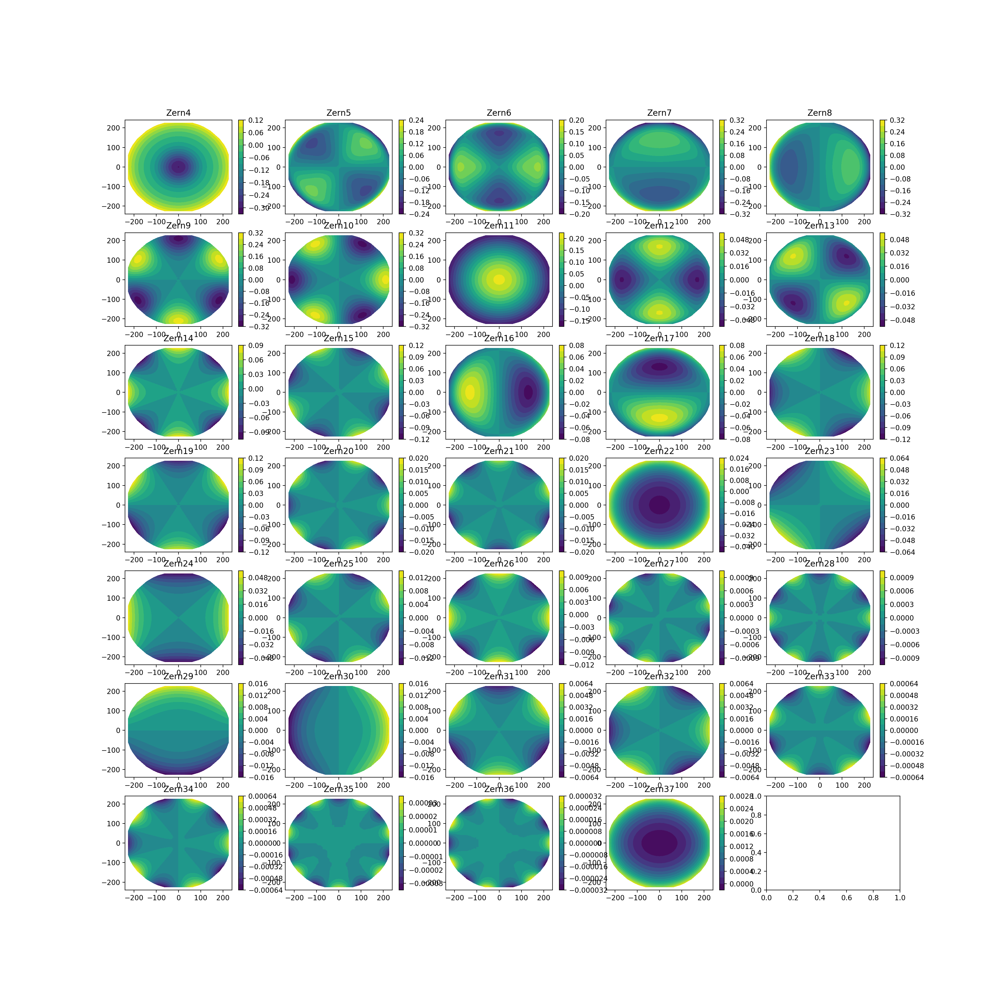

In [16]:
f,ax = plt.subplots(7,5,figsize=(20,20))
axf = ax.flatten()
aplots = []

for iz in range(3,37):
    aplot = axf[iz-3].tricontourf(x_fpw, y_fpw, zern_fpw[:,iz], 15)
    axf[iz-3].set_xlim(-240,240)
    axf[iz-3].set_ylim(-240,240)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


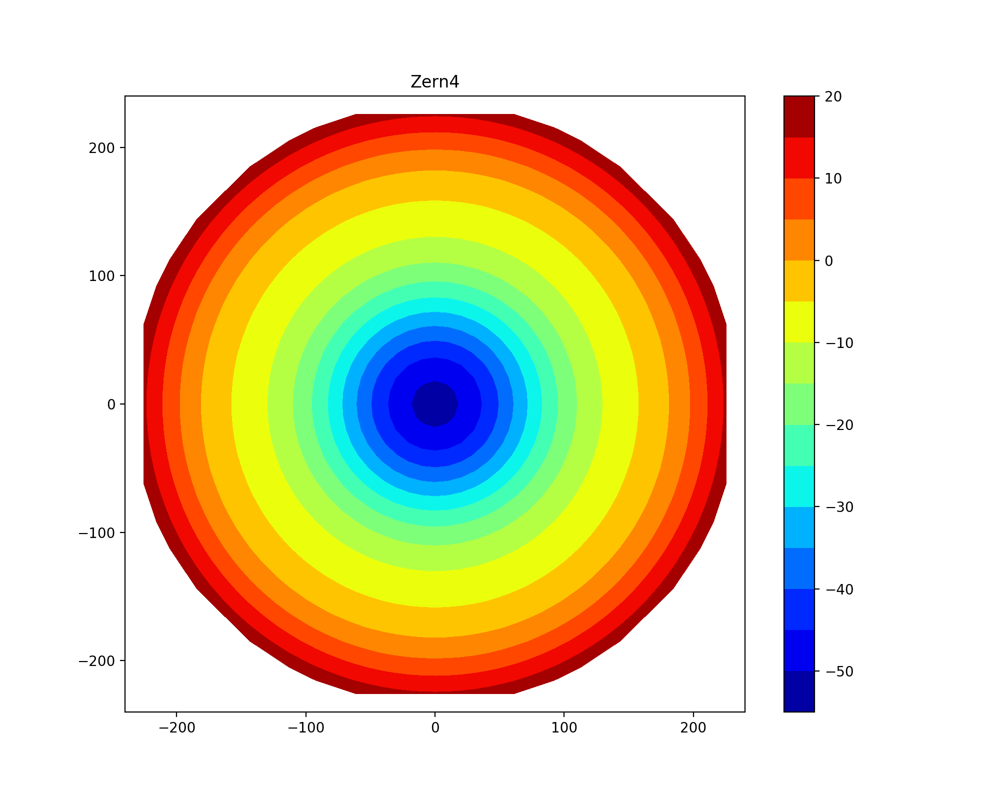

Text(0.5, 1.0, 'Zern4')

In [24]:
from matplotlib import cm

# plots with different color scheme
f,ax = plt.subplots(1,1,figsize=(10,8))

iz = 3
aplot = ax.tricontourf(x_fpw, y_fpw, zern_fpw[:,iz]*172.,15,cmap=cm.jet)
ax.set_xlim(-240,240)
ax.set_ylim(-240,240)
f.colorbar(aplot,ax=ax)
ax.set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


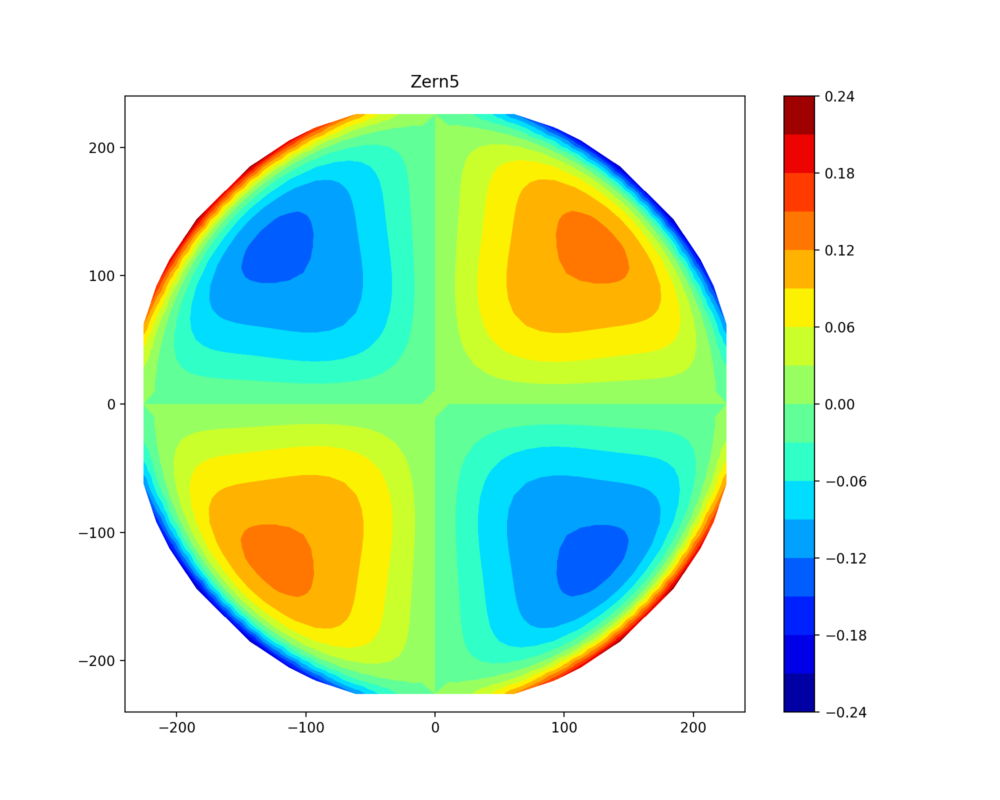

Text(0.5, 1.0, 'Zern5')

In [27]:
# plots with different color scheme
f,ax = plt.subplots(1,1,figsize=(10,8))

iz = 4
aplot = ax.tricontourf(x_fpw, y_fpw, zern_fpw[:,iz],15,cmap=cm.jet)
ax.set_xlim(-240,240)
ax.set_ylim(-240,240)
f.colorbar(aplot,ax=ax)
ax.set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


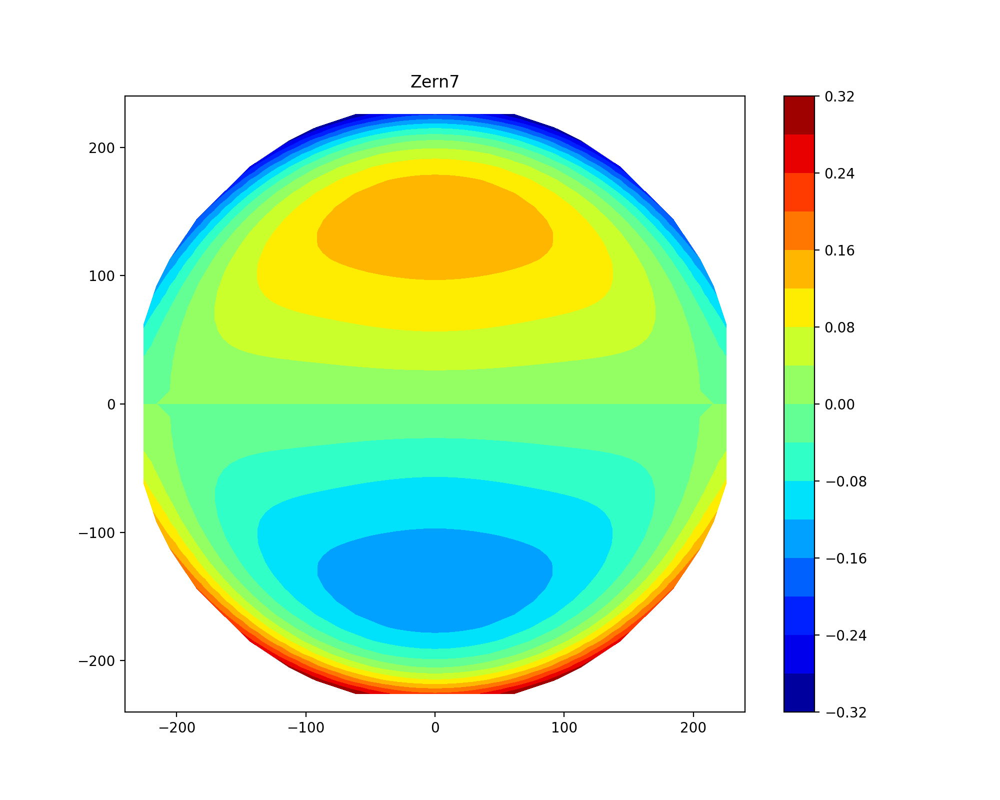

Text(0.5, 1.0, 'Zern7')

In [28]:
# plots with different color scheme
f,ax = plt.subplots(1,1,figsize=(10,8))

iz = 6
aplot = ax.tricontourf(x_fpw, y_fpw, zern_fpw[:,iz],15,cmap=cm.jet)
ax.set_xlim(-240,240)
ax.set_ylim(-240,240)
f.colorbar(aplot,ax=ax)
ax.set_title("Zern%d" % (iz+1))

In [47]:
# Interpolation for Zernike coefficients
from scipy.interpolate import SmoothBivariateSpline
from scipy.interpolate import Rbf

In [48]:
dictOfInterps = {}
for iZ in range(3,37):
    dictOfInterps[iZ] = Rbf(x_fpw, y_fpw, zern_fpw[:,iZ])

<IPython.core.display.Javascript object>


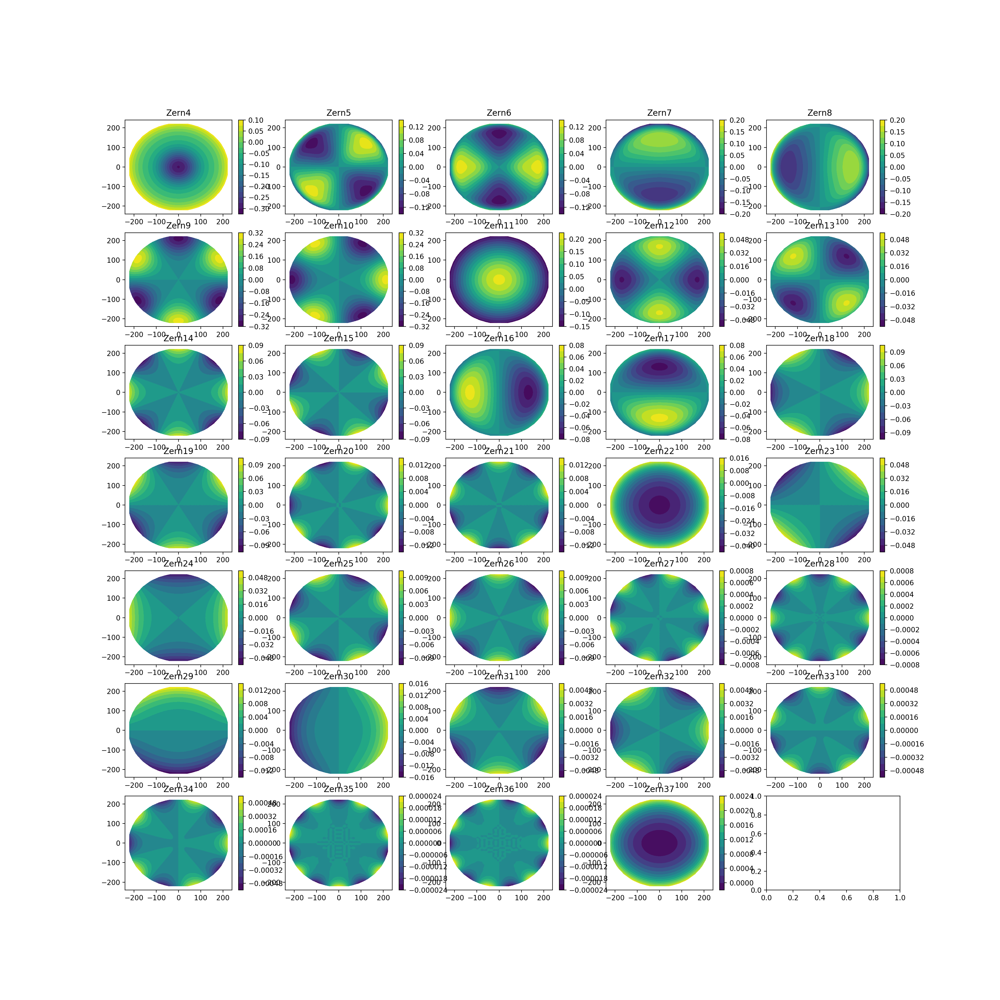

In [53]:
f,ax = plt.subplots(7,5,figsize=(20,20))
axf = ax.flatten()
aplots = []

yin, xin = np.mgrid[-235.:235.:100j,-235.:235.:100j]
rin = np.sqrt(xin*xin+yin*yin)
ok = rin<=225.
xgood = xin[ok]
ygood = yin[ok]

for iz in range(3,37):
    zern_interp = dictOfInterps[iz](xgood,ygood)
    aplot = axf[iz-3].tricontourf(xgood, ygood, zern_interp, 15)
    axf[iz-3].set_xlim(-240,240)
    axf[iz-3].set_ylim(-240,240)
    f.colorbar(aplot,ax=axf[iz-3])
    axf[iz-3].set_title("Zern%d" % (iz+1))

<IPython.core.display.Javascript object>


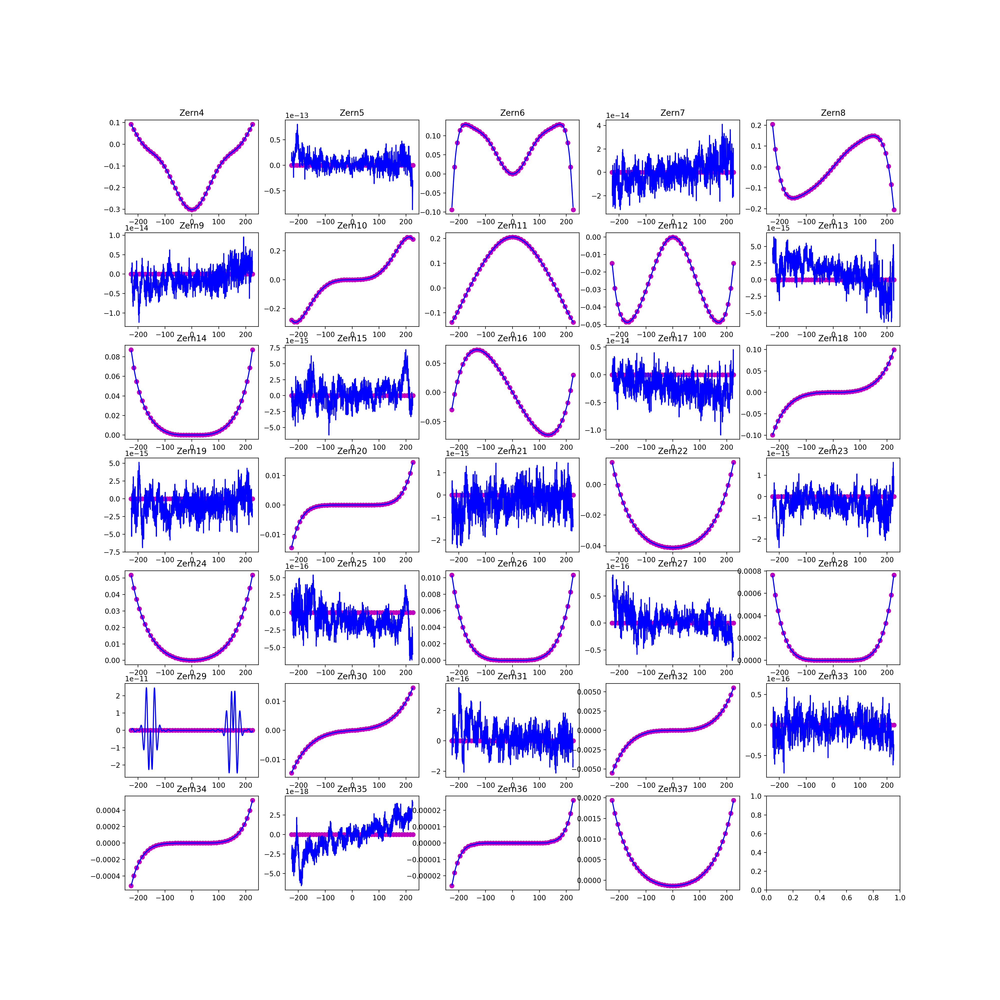

In [60]:
# compare Zernike maps
f,ax = plt.subplots(7,5,figsize=(20,20))
axf = ax.flatten()
aplots = []

xtry = np.linspace(-225.,225.,1000)
ytry = np.zeros(xtry.shape[0])

pick = np.abs(y_fpw)<1e-5
xvals = x_fpw[pick]
yvals = y_fpw[pick]


for iz in range(3,37):
    zern_interp = dictOfInterps[iz](xtry,ytry)
    zvals = zern_fpw[pick,iz]
    aplot = axf[iz-3].plot(xvals,zvals,'mo')
    aplot = axf[iz-3].plot(xtry,zern_interp,'b-')
    axf[iz-3].set_title("Zern%d" % (iz+1))

In [62]:
# save objects for interpolation
newoutdict = {}
newoutdict['x'] = x_fpw
newoutdict['y'] = y_fpw
newoutdict['zcoeff'] = zern_fpw

# Pickle dictionary using protocol 0.
pickle.dump(newoutdict, open('/Users/roodman/Astrophysics/Zemax/Decam/ZernikeMaps/decam-2012/decam_2012-nominalzernike.pickle','wb'))

